<!-- # Data generation

> Collect random rollouts from the MeltingPot environments and save them to disk for later use in training and evaluation. -->

In [ ]:
#| default_exp data.generate_data

In [ ]:
#| hide
from nbdev.showdoc import *

In [ ]:
#| export
from fastcore import *
from fastcore.utils import *

<!-- ## Melting Pot -->

## Melting Pot

In [ ]:
# from shimmy import MeltingPotCompatibilityV0
# from shimmy.utils.meltingpot import load_meltingpot

# env = load_meltingpot("collaborative_cooking__circuit")
# env = MeltingPotCompatibilityV0(env, render_mode="rgb_array")
# observations = env.reset()
# lst_agents = []
# i =0
# while env.agents:
#     actions = {agent: env.action_space(agent).sample() for agent in env.agents}
#     observations, rewards, terminations, truncations, infos = env.step(actions)
#     lst_agents.append(observations['player_0']['RGB'])
#     if i == 10: 
#         break
#     i += 1

# env.close()

In [ ]:
# #| export

# from shimmy import MeltingPotCompatibilityV0
# from shimmy.utils.meltingpot import load_meltingpot
# import numpy as np

# env = load_meltingpot("collaborative_cooking__circuit")
# env = MeltingPotCompatibilityV0(env, render_mode="rgb_array")

# seq_len = 1000
# rollouts = 10
# data_dir = './data'
# noise_type = 'brown'



# for i in range(rollouts):
#     # reset environment
#     reset_out = env.reset()
#     if isinstance(reset_out, tuple):  # unpack tuple (obs, info)
#         observations, infos = reset_out
#     else:
#         observations = reset_out
#         infos = None

#     if noise_type == 'white':
#         for agent in env.agents:
#             a_rollout[agent] = [env.action_space(agent).sample() for _ in range(seq_len)]
    
#     elif noise_type == 'brown':
#         for agent in env.agents:
#             a_rollout[agent] = sample_continuous_policy(env.action_space(agent), seq_len, 1. / 50)

#     s_rollout = []
#     r_rollout = []
#     d_rollout = []

#     t = 0
#     while True:

#         actions = {}

#         action = a_rollout[t]
#         t += 1

#         for agent in env.agents:
#             action = env.action_space(agent).sample()
#             actions[agent] = action

#             # access observation dict correctly
#             obs = observations[agent]
#             data[agent]["obs"].append(obs)
#             data[agent]["actions"].append(action)

#         s, r, terminated, truncated, info = env.step(action)
#         done = terminated or truncated

#         s_rollout += [s]
#         r_rollout += [r]
#         d_rollout += [done]

#         if done:
#             print("> End of rollout {}, {} frames...".format(i, len(s_rollout)))
#             np.savez(join(data_dir, 'rollout_{}'.format(i)),
#                         observations=np.array(s_rollout),
#                         rewards=np.array(r_rollout),
#                         actions=np.array(a_rollout),
#                         terminals=np.array(d_rollout))
#             break




        

#         # perform step
#         step_out = env.step(actions)
#         if len(step_out) == 5:
#             observations, rewards, terminations, truncations, infos = step_out
#         else:
#             observations, rewards, terminations, truncations = step_out
#             infos = None

#         # store rewards
#         for agent, r in rewards.items():
#             data[agent]["rewards"].append(r)

# env.close()

# # 5. Convert to numpy arrays
# for agent, d in data.items():
#     d["obs"] = np.array(d["obs"])
#     d["actions"] = np.array(d["actions"])
#     d["rewards"] = np.array(d["rewards"])

# # 6. Print summary
# for agent, d in data.items():
#     print(f"{agent}: {len(d['obs'])} steps, avg reward = {np.mean(d['rewards']):.3f}")


Gym has been unmaintained since 2022 and does not support NumPy 2.0 amongst other critical functionality.
Please upgrade to Gymnasium, the maintained drop-in replacement of Gym, or contact the authors of your software and request that they upgrade.
Users of this version of Gym should be able to simply replace 'import gym' with 'import gymnasium as gym' in the vast majority of cases.
See the migration guide at https://gymnasium.farama.org/introduction/migration_guide/ for additional information.
/home/ahmed/miniconda3/envs/meltpot/lib/python3.11/site-packages/pygame/pkgdata.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import resource_stream, resource_exists


W @/home/ahmed/miniconda3/envs/meltpot/lib/python3.11/site-packages/meltingpot/lua/modules/base_simulation.lua:219] GameObject 'scene' did not have a StateManager component, but explicitly specifying one is strongly preferred. Using a default.
W @/home/ahmed/miniconda3/envs/meltpot/lib/python3.11/site-packages/meltingpot/lua/modules/base_simulation.lua:225] GameObject 'scene' did not have a Transform component, but explicitly specifying one is strongly preferred. Using a default.
W @/home/ahmed/miniconda3/envs/meltpot/lib/python3.11/site-packages/meltingpot/lua/modules/prefab_utils.lua:83] Character	x	not found in the charPrefabMap. Ignoring.
W @/home/ahmed/miniconda3/envs/meltpot/lib/python3.11/site-packages/meltingpot/lua/modules/prefab_utils.lua:83] Character	x	not found in the charPrefabMap. Ignoring.
W @/home/ahmed/miniconda3/envs/meltpot/lib/python3.11/site-packages/meltingpot/lua/modules/prefab_utils.lua:83] Character	x	not found in the charPrefabMap. Ignoring.
W @/home/ahmed/mi

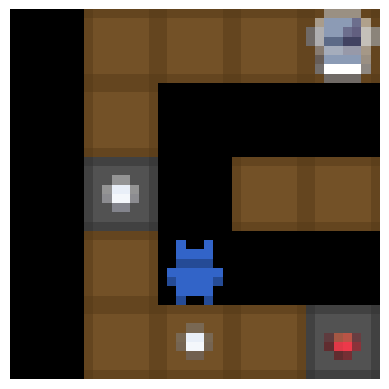

In [ ]:
# img = data['player_0']['obs'][20]['RGB'].shape
# import matplotlib.pyplot as plt
# plt.imshow(data['player_0']['obs'][50]['RGB'])
# plt.axis('off')
# plt.show()


In [ ]:
# data['player_0']['obs'][0].keys()

dict_keys(['COLLECTIVE_REWARD', 'RGB'])

In [ ]:
# data['player_0'].keys()

dict_keys(['obs', 'actions', 'rewards'])

In [ ]:
# import numpy as np
# import math
# import os
# from shimmy import MeltingPotCompatibilityV0
# from shimmy.utils.meltingpot import load_meltingpot


# def sample_continuous_policy(action_space, seq_len, dt):
#     """Sample a continuous Brownian motion policy for Box action spaces."""
#     actions = [action_space.sample()]
#     for _ in range(seq_len - 1):
#         daction_dt = np.random.randn(*actions[-1].shape)
#         actions.append(
#             np.clip(actions[-1] + math.sqrt(dt) * daction_dt,
#                     action_space.low, action_space.high))
#     return actions


# def sample_discrete_policy(action_space, seq_len, dt):
#     """Sample a Brownian-like random walk over discrete actions."""
#     current_action = action_space.sample()
#     actions = [current_action]
#     for _ in range(seq_len - 1):
#         if np.random.rand() < 1 - dt * 10:  # stay same most of the time
#             next_action = current_action
#         else:
#             next_action = action_space.sample()
#         actions.append(next_action)
#         current_action = next_action
#     return actions


# def generate_data_meltingpot(env_name="collaborative_cooking__circuit",
#                              rollouts=3,
#                              seq_len=1000,
#                              dt=1./50,
#                              data_dir='../data',
#                              noise_type='brown'):
#     """Generate and save rollouts from a MeltingPot environment (Gym-style)."""
#     assert os.path.exists(data_dir), "The data directory does not exist..."

#     raw_env = load_meltingpot(env_name)
#     env = MeltingPotCompatibilityV0(raw_env, render_mode="rgb_array")

#     for rollout_idx in range(rollouts):
#         print(f"\nStarting rollout {rollout_idx}...")
#         obs, info = env.reset()

#         # Initialize per-agent data containers
#         agents = list(obs.keys())
#         agent_data = {
#             agent: {"observations": [], "rewards": [], "actions": [], "terminations": []}
#             for agent in agents
#         }

#         # Prepare per-agent action sequences
#         policies = {}
#         for agent in agents:
#             a_space = env.action_space(agent)
#             if hasattr(a_space, "low"):  # Box space
#                 policies[agent] = sample_continuous_policy(a_space, seq_len, dt)
#             else:  # Discrete space
#                 policies[agent] = sample_discrete_policy(a_space, seq_len, dt)

#         for t in range(seq_len):
#             # Record observations
#             for agent in agents:
#                 agent_data[agent]["observations"].append(obs[agent])

#             # Select next actions for all agents
#             actions = {agent: policies[agent][t] for agent in agents}

#             # Step environment
#             obs, rewards, terminated, truncated, info = env.step(actions)

#             # Record rewards and terminations
#             for agent in agents:
#                 agent_data[agent]["rewards"].append(rewards[agent])
#                 done = terminated[agent] or truncated[agent]
#                 agent_data[agent]["terminations"].append(done)
#                 agent_data[agent]["actions"].append(actions[agent])

#             # If all agents are done → break early
#             if all(terminated.values()) or all(truncated.values()):
#                 print(f"> Rollout {rollout_idx} ended early at step {t}")
#                 break

#         # Save rollout to disk
#         save_path = os.path.join(data_dir, f"rollout_{rollout_idx}.npz")
#         # Merge per-agent arrays into a single dict
#         save_dict = {}
#         for ag in agents:
#             save_dict[f"{ag}_observations"] = np.array(agent_data[ag]["observations"])
#             save_dict[f"{ag}_rewards"] = np.array(agent_data[ag]["rewards"])
#             save_dict[f"{ag}_actions"] = np.array(agent_data[ag]["actions"])
#             save_dict[f"{ag}_terminations"] = np.array(agent_data[ag]["terminations"])

#         np.savez_compressed(save_path, **save_dict)
#         print(f"> Saved rollout {rollout_idx} to {save_path}")

#     env.close()


In [ ]:
# generate_data_meltingpot(rollouts= 10000)


Starting rollout 0...
W @/home/ahmed/miniconda3/envs/meltpot/lib/python3.11/site-packages/meltingpot/lua/modules/base_simulation.lua:219] GameObject 'scene' did not have a StateManager component, but explicitly specifying one is strongly preferred. Using a default.
W @/home/ahmed/miniconda3/envs/meltpot/lib/python3.11/site-packages/meltingpot/lua/modules/base_simulation.lua:225] GameObject 'scene' did not have a Transform component, but explicitly specifying one is strongly preferred. Using a default.
W @/home/ahmed/miniconda3/envs/meltpot/lib/python3.11/site-packages/meltingpot/lua/modules/prefab_utils.lua:83] Character	x	not found in the charPrefabMap. Ignoring.
W @/home/ahmed/miniconda3/envs/meltpot/lib/python3.11/site-packages/meltingpot/lua/modules/prefab_utils.lua:83] Character	x	not found in the charPrefabMap. Ignoring.
W @/home/ahmed/miniconda3/envs/meltpot/lib/python3.11/site-packages/meltingpot/lua/modules/prefab_utils.lua:83] Character	x	not found in the charPrefabMap. Igno

In [ ]:
# import numpy as np
# rollout_0 = np.load('../data/rollout_1.npz', allow_pickle=True)
# print(list(rollout_0.keys()))

['player_0_observations', 'player_0_rewards', 'player_0_actions', 'player_0_terminations', 'player_1_observations', 'player_1_rewards', 'player_1_actions', 'player_1_terminations']


In [ ]:
# rollout_0['player_0_observations'].shape

(500,)

In [ ]:
# rollout_0['player_1_observations'][0].keys()

dict_keys(['COLLECTIVE_REWARD', 'RGB'])

In [ ]:
# rollout_0['player_1_observations'][200]['COLLECTIVE_REWARD'].

()

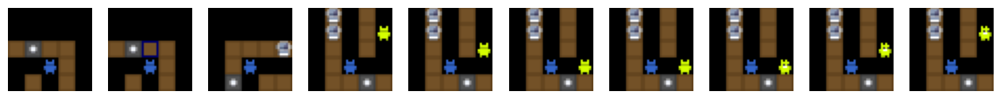

In [ ]:
# seq_imgs = [rollout_0['player_0_observations'][i]['RGB'] for i in range(10)]
# import matplotlib.pyplot as plt
# fig, axs = plt.subplots(1, 10, figsize=(16, 8))
# for i, img in enumerate(seq_imgs):
#     axs[i].imshow(img)
#     axs[i].axis('off')
# plt.savefig('seq_imgs.pdf')
# plt.show()


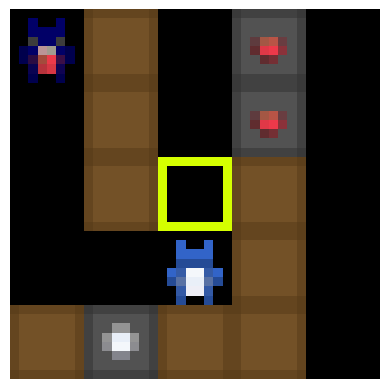

In [ ]:
# img = rollout_0['player_1_observations'][-1]['RGB']
# import matplotlib.pyplot as plt
# plt.imshow(img)
# plt.axis('off')
# plt.show()

In [ ]:
# img.shape

(40, 40, 3)

In [ ]:
# import torch
# tensor_img = torch.tensor(img)
# tensor_img.view(3, 40, 40).shape

torch.Size([3, 40, 40])

In [ ]:
# [rollout_0['player_0_rewards'][i] for i in range(len(rollout_0['player_0_rewards'])) if rollout_0['player_0_rewards'][i] != 0]

[]

In [ ]:
# [rollout_0['player_1_observations'][i]['COLLECTIVE_REWARD'] for i in range(len(rollout_0['player_0_rewards'])) if rollout_0['player_1_observations'][i]['COLLECTIVE_REWARD'] != 0]
# # rollout_0['player_1_observations'][200]['COLLECTIVE_REWARD']

[]

In [ ]:
# from meltingpot import substrate
# env = substrate.build("collaborative_cooking__circuit", roles=["player_0", "player_1"])



## MarlGrid V2

In [ ]:
import numpy as np
import os
from MAWM.envs.marl_grid.envs.findgoal_env.environments import make_environment
from MAWM.envs.marl_grid.envs.findgoal_env.cfgs import config


def generate_data_marl_grid(env_name="marl_grid",
                            rollouts=3,
                            seed_steps=4000,
                            seq_len=50,
                            data_dir='../marl_grid_data'):
    """Generate and save full rollouts from a MarlGrid environment.
       Later, training code samples subsequences uniformly inside each rollout.
    """

    if not os.path.exists(data_dir):
        os.makedirs(data_dir)

    def create_env():
        config.env_cfg.seed = np.random.randint(0, 10000)
        config.env_cfg.max_steps = seed_steps
        
        env = make_environment(config.env_cfg)
        agents = [f'agent_{i}' for i in range(config.env_cfg.num_agents)]
        return env, agents

    for rollout_idx in range(rollouts):

        print(f"\nStarting rollout {rollout_idx}...")
        env, agents = create_env()

        # Fresh buffers for each rollout
        agent_data = {ag: {"obs": [], "rew": [], "act": [], "term": [], "info": []} for ag in agents}

        obs = env.reset()
        for ag in agents:
            agent_data[ag]["obs"].append(obs[ag])
            
        episode_len = 0

        for t in range(seed_steps):

            actions = {ag: env.action_space.sample() for ag in agents}
            obs, rew, done, info = env.step(actions)

            for ag in agents:
                agent_data[ag]["obs"].append(obs[ag])
                agent_data[ag]["rew"].append(rew[ag])
                agent_data[ag]["act"].append(actions[ag])
                agent_data[ag]["info"].append(info[ag])
                # agent_data[ag]["term"].append(done['__all__'])

            episode_len += 1
            if done['__all__']:
                print(f"> Rollout {rollout_idx} ended early at step {t}")
                break

        save_path = os.path.join(data_dir, f"rollout_{rollout_idx}.npz")
        save_dict = {"episode_len": episode_len}

        for ag in agents:
            save_dict[f"{ag}_obs"] = np.array(agent_data[ag]["obs"])
            save_dict[f"{ag}_rew"] = np.array(agent_data[ag]["rew"])
            save_dict[f"{ag}_act"] = np.array(agent_data[ag]["act"])
            save_dict[f"{ag}_info"] = np.array(agent_data[ag]["info"])
            # save_dict[f"{ag}_term"] = np.array(agent_data[ag]["term"])

        np.savez_compressed(save_path, **save_dict)
        print(f"> Saved rollout {rollout_idx} to {save_path}")

        env.close()


### Data generation code

In [ ]:
# generate_data_marl_grid(rollouts= int(1e6))

In [ ]:
#| hide
import numpy as np
idx = np.random.randint(0, 10000)
rollout = np.load(f'../marl_grid_data/rollout_{idx}.npz', allow_pickle=True)
print(list(rollout.keys()))

['episode_len', 'agent_0_obs', 'agent_0_rew', 'agent_0_act', 'agent_0_info', 'agent_1_obs', 'agent_1_rew', 'agent_1_act', 'agent_1_info']


In [ ]:
rollout['episode_len']

array(829)

### test

In [ ]:
generate_data_marl_grid(rollouts= 1, seed_steps = 100,data_dir='../test_marl_data')

In [ ]:
import numpy as np
idx = 0
rollout = np.load(f'../test_marl_data/rollout_{idx}.npz', allow_pickle=True)
print(list(rollout.keys()))

['episode_len', 'agent_0_obs', 'agent_0_rew', 'agent_0_act', 'agent_0_info', 'agent_1_obs', 'agent_1_rew', 'agent_1_act', 'agent_1_info']


In [ ]:
rollout['agent_0_obs'].shape

(101,)

In [ ]:
rollout['agent_0_obs'][0].keys()

dict_keys(['pov', 'selfpos', 'orientation', 'identity'])

In [ ]:
rollout['agent_0_obs'][0]['pov'].shape

(42, 42, 3)

In [ ]:
rollout['agent_0_obs'][10]['orientation']

2

88
Action taken: Left


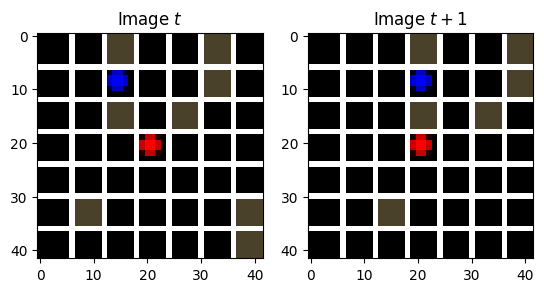

In [ ]:
# act_str = ["Right", "Down", "Left", "Up", "Done", "Toggle", "Pickup", "Drop"]
# def plot_two_ing_side_by_side(img1, img2):
#     # img1 = unnormalize(img1)
#     # img2 = unnormalize(img2)

#     import cv2
#     import matplotlib.pyplot as plt
#     def show_grid(img, GRID = 7, CELL = 6):
#         if not CELL:
#             CELL = img.shape[0] // GRID
        
#         vis = img.copy()
#         for i in range(1, GRID):
#             cv2.line(vis, (i*CELL, 0), (i*CELL, 42), (255,255,255), 1)
#             cv2.line(vis, (0, i*CELL), (42, i*CELL), (255,255,255), 1)
#         return vis
    
#     fig, axs = plt.subplots(1, 2)

#     vis1 = show_grid(img1, GRID=7, CELL=6)
#     vis2 = show_grid(img2, GRID=7, CELL=6)

#     axs[0].imshow(vis1)
#     axs[0].set_title('Image $t$')

#     axs[1].imshow(vis2)
#     axs[1].set_title('Image $t+1$')
#     plt.savefig("example2.png")
#     plt.show()

# indx = np.random.randint(0, len(rollout['agent_0_obs'])-2)
# print(indx)
# img1 = rollout['agent_0_obs'][indx]['pov']
# # img1 = np.transpose(img1, (1, 2, 0))
# print(f"Action taken: {act_str[rollout['agent_0_act'][indx]]}")
# img2 = rollout['agent_0_obs'][indx + 1]['pov']
# # img2 = np.transpose(img2, (1, 2, 0))
# # print(img2.dtype)
# plot_two_ing_side_by_side(img1.astype(np.uint8), img2.astype(np.uint8))

In [ ]:
import numpy as np
actions = np.load("../mains/actions.npy", allow_pickle=True)
directions = np.load("../mains/directions.npy", allow_pickle=True)

In [ ]:
# right, down, left, up
# if action in {0, 1, 2, 3}

In [ ]:
[(i, directions[i]) for i in range(1, 10)]

[(1, {'agent_0': (0, array([ 5, 10])), 'agent_1': (0, array([4, 7]))}),
 (2, {'agent_0': (0, array([ 6, 10])), 'agent_1': (3, array([4, 6]))}),
 (3, {'agent_0': (1, array([ 6, 11])), 'agent_1': (2, array([3, 6]))}),
 (4, {'agent_0': (1, array([ 6, 11])), 'agent_1': (0, array([4, 6]))}),
 (5, {'agent_0': (0, array([ 7, 11])), 'agent_1': (3, array([4, 5]))}),
 (6, {'agent_0': (3, array([ 7, 10])), 'agent_1': (1, array([4, 6]))}),
 (7, {'agent_0': (0, array([ 8, 10])), 'agent_1': (2, array([3, 6]))}),
 (8, {'agent_0': (2, array([ 7, 10])), 'agent_1': (0, array([4, 6]))}),
 (9, {'agent_0': (3, array([7, 9])), 'agent_1': (0, array([5, 6]))})]

In [ ]:
[(i, actions[i]) for i in range(10)]

[(0, {'agent_0': 'right', 'agent_1': 'up'}),
 (1, {'agent_0': 'down', 'agent_1': 'left'}),
 (2, {'agent_0': 'done', 'agent_1': 'right'}),
 (3, {'agent_0': 'right', 'agent_1': 'up'}),
 (4, {'agent_0': 'up', 'agent_1': 'down'}),
 (5, {'agent_0': 'right', 'agent_1': 'left'}),
 (6, {'agent_0': 'left', 'agent_1': 'right'}),
 (7, {'agent_0': 'up', 'agent_1': 'right'}),
 (8, {'agent_0': 'left', 'agent_1': 'right'}),
 (9, {'agent_0': 'up', 'agent_1': 'right'})]

### Minigrid test semantics action

In [ ]:
action_mapping = {
    0: "Left",
    1: "Right",
    2: "Forward",
    3: "Pickup",
    4: "Drop",
    5: "Toggle",
    6: "Done"
    }

In [ ]:
import numpy as np
import os

import gymnasium as gym
import gymnasium as gym
from minigrid.wrappers import RGBImgPartialObsWrapper, ImgObsWrapper, RGBImgObsWrapper
# env = gym.make("MiniGrid-Empty-5x5-v0", render_mode="human")

def generate_data_mini_grid(env_name="mini_grid",
                            rollouts=3,
                            seed_steps=200,
                            seq_len=50,
                            data_dir='../test_marl_data'):
    """Generate and save full rollouts from a MarlGrid environment.
       Later, training code samples subsequences uniformly inside each rollout.
    """

    if not os.path.exists(data_dir):
        os.makedirs(data_dir)

    def create_env():
        # env = gym.make("MiniGrid-Empty-5x5-v0", render_mode="rgb_array")
        env = gym.make('MiniGrid-Empty-16x16-v0', render_mode="rgb_array")
        # env = RGBImgPartialObsWrapper(env) # Get pixel observations
        env = RGBImgObsWrapper(env) # Get rid of the 'mission' field
        
        return env

    for rollout_idx in range(1, rollouts):

        print(f"\nStarting rollout {rollout_idx}...")
        env = create_env()

        # Fresh buffers for each rollout
        agent_data = {"obs": [], "rew": [], "act": []}

        obs, _ = env.reset() # This now produces an RGB tensor only
        # print(obs.shape)
        agent_data["obs"].append(obs)
            
        episode_len = 0

        for t in range(seed_steps):

            action = env.action_space.sample()
            obs, rew, terminated, truncated, info = env.step(action)
            # print(action_mapping[action])

            agent_data["obs"].append(obs)
            agent_data["rew"].append(rew)
            agent_data["act"].append(action)

            episode_len += 1
            if terminated or truncated:
                print(f"> Rollout {rollout_idx} ended early at step {t}")
                break

        save_path = os.path.join(data_dir, f"rollout_{rollout_idx}.npz")
        save_dict = {"episode_len": episode_len}

        # print(len(agent_data["obs"]))
        # import ipdb; ipdb.set_trace()
        save_dict["obs"] = np.array(agent_data["obs"])
        save_dict["rew"] = np.array(agent_data["rew"])
        save_dict["act"] = np.array(agent_data["act"])

        np.savez_compressed(save_path, **save_dict)
        print(f"> Saved rollout {rollout_idx} to {save_path}")

        env.close()


In [ ]:
generate_data_mini_grid(rollouts= 2, data_dir='../mini_grid_data')


Starting rollout 1...
> Saved rollout 1 to ../mini_grid_data/rollout_1.npz


In [ ]:
# load data
import numpy as np
idx = 1
rollout = np.load(f'../mini_grid_data/rollout_{idx}.npz', allow_pickle=True)
print(list(rollout.keys()))

['episode_len', 'obs', 'rew', 'act']


76


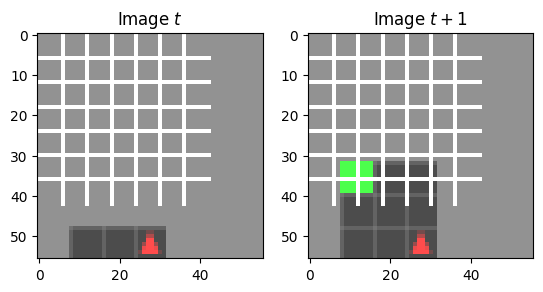

In [ ]:
# act_str = ["Right", "Down", "Left", "Up", "Done", "Toggle", "Pickup", "Drop"]
# def plot_two_ing_side_by_side(img1, img2):
#     import cv2
#     import matplotlib.pyplot as plt
#     def show_grid(img, GRID = 7, CELL = 6):
#         if not CELL:
#             CELL = img.shape[0] // GRID
        
#         vis = img.copy()
#         for i in range(1, GRID):
#             cv2.line(vis, (i*CELL, 0), (i*CELL, 42), (255,255,255), 1)
#             cv2.line(vis, (0, i*CELL), (42, i*CELL), (255,255,255), 1)
#         return vis
    
#     fig, axs = plt.subplots(1, 2)

#     vis1 = show_grid(img1, GRID=7, CELL=6)
#     vis2 = show_grid(img2, GRID=7, CELL=6)
#     axs[0].imshow(vis1)
#     axs[0].set_title('Image $t$')

#     axs[1].imshow(vis2)
#     axs[1].set_title('Image $t+1$')
#     plt.savefig("example2.png")
#     plt.show()

# indx = np.random.randint(0, len(rollout['obs'])-2)
# print(indx)

# img1 = rollout['obs'][indx]
# # print(f"Action taken: {act_str[rollout['act'][indx]]}")
# img2 = rollout['obs'][indx + 1]

# plot_two_ing_side_by_side(img1, img2)

In [ ]:
rollout['obs'][0]['image'].shape

(128, 128, 3)

136
Left


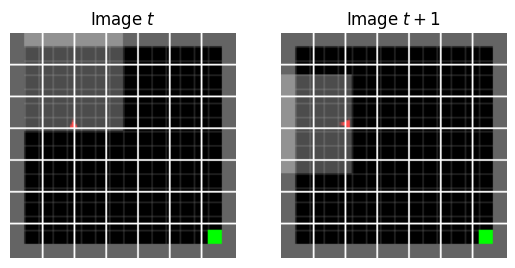

In [ ]:
# def plot_two_ing_side_by_side(img1, img2):
#     import cv2
#     import matplotlib.pyplot as plt
#     import numpy as np

#     def show_grid(img, GRID=7):
#         # Get actual image dimensions
#         h, w = img.shape[:2]
#         cell_h = h // GRID
#         cell_w = w // GRID
        
#         # Ensure we work on a copy to avoid modifying original data
#         vis = img.copy()
        
#         # Draw lines based on the dynamic height (h) and width (w)
#         for i in range(1, GRID):
#             # Vertical lines: (x, y) coordinates
#             cv2.line(vis, (i * cell_w, 0), (i * cell_w, h), (255, 255, 255), 1)
#             # Horizontal lines
#             cv2.line(vis, (0, i * cell_h), (w, i * cell_h), (255, 255, 255), 1)
#         return vis
    
#     fig, axs = plt.subplots(1, 2)

#     # The function now automatically handles the 56x56 size
#     vis1 = show_grid(img1, GRID=7)
#     vis2 = show_grid(img2, GRID=7)
    
#     axs[0].imshow(vis1)
#     axs[0].set_title('Image $t$')
#     axs[0].axis('off') # Optional: hides the pixel axis

#     axs[1].imshow(vis2)
#     axs[1].set_title('Image $t+1$')
#     axs[1].axis('off')

#     plt.savefig("example2.png", bbox_inches='tight')
#     plt.show()

# indx = np.random.randint(0, len(rollout['obs'])-2)
# print(indx)

# img1 = rollout['obs'][indx]['image']
# # print(f"Action taken: {act_str[rollout['act'][indx]]}")
# print(action_mapping[rollout['act'][indx]])
# img2 = rollout['obs'][indx + 1]['image']

# plot_two_ing_side_by_side(img1, img2)

In [ ]:
action_mapping = {
    0: "Left",
    1: "Right",
    2: "Forward",
    3: "Pickup",
    4: "Drop",
    5: "Toggle",
    6: "Done"
    }

In [ ]:
# make a gif of sequence of images
import imageio
def make_gif_from_images(image_sequence, gif_name='sequence.gif', duration=0.2):
    frames = []
    for img in image_sequence:
        frames.append(img)
    imageio.mimsave(gif_name, frames, duration=duration)

# indx = np.random.randint(0, len(rollout['obs'])-10)
# print(indx)
img_sequence = [rollout['obs'][i]['image'] for i in range(len(rollout['obs']))]
make_gif_from_images(img_sequence, gif_name='mini_grid_sequence.gif', duration=10)


['Pickup', 'Left', 'Pickup', 'Pickup', 'Left', 'Drop', 'Done', 'Done', 'Done', 'Drop', 'Forward', 'Toggle', 'Drop', 'Drop', 'Pickup', 'Left', 'Forward', 'Toggle', 'Toggle', 'Pickup', 'Right', 'Left', 'Left', 'Toggle', 'Left', 'Forward', 'Left', 'Right', 'Forward', 'Toggle', 'Right', 'Toggle', 'Right', 'Toggle', 'Done', 'Toggle', 'Done', 'Toggle', 'Drop', 'Toggle', 'Done', 'Toggle', 'Pickup', 'Drop', 'Pickup', 'Right', 'Done', 'Done', 'Forward', 'Toggle', 'Drop', 'Done', 'Done', 'Forward', 'Pickup', 'Pickup', 'Toggle', 'Pickup', 'Drop', 'Toggle', 'Toggle', 'Right', 'Forward', 'Right', 'Pickup', 'Pickup', 'Left', 'Drop', 'Toggle', 'Done', 'Done', 'Forward', 'Drop', 'Right', 'Forward', 'Done', 'Pickup', 'Right', 'Left', 'Right', 'Done', 'Right', 'Left', 'Drop', 'Forward', 'Drop', 'Drop', 'Drop', 'Left', 'Right', 'Forward', 'Done', 'Forward', 'Right', 'Left', 'Left', 'Forward', 'Drop', 'Right', 'Toggle', 'Toggle', 'Forward', 'Right', 'Done', 'Left', 'Pickup', 'Toggle', 'Forward', 'Toggle',

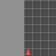

In [ ]:
# play gif
from IPython.display import Image
act_sequence = [action_mapping[rollout['act'][i]] for i in range(len(rollout['act']))]
print(act_sequence)
Image(filename='mini_grid_sequence.gif', width=400, height=400)

In [ ]:
act_sequence = [action_mapping[rollout['act'][i]] for i in range(len(rollout['act']))]

In [ ]:
act_sequence

['Pickup',
 'Left',
 'Right',
 'Pickup',
 'Drop',
 'Right',
 'Left',
 'Drop',
 'Drop',
 'Left',
 'Drop',
 'Pickup',
 'Pickup',
 'Forward',
 'Toggle',
 'Done',
 'Done',
 'Forward',
 'Drop',
 'Drop',
 'Left',
 'Left',
 'Forward',
 'Left',
 'Forward',
 'Pickup',
 'Pickup',
 'Pickup',
 'Drop',
 'Right',
 'Forward',
 'Left',
 'Left',
 'Forward',
 'Done',
 'Toggle',
 'Right',
 'Forward',
 'Toggle',
 'Left',
 'Forward',
 'Right',
 'Drop',
 'Toggle',
 'Right',
 'Left',
 'Drop',
 'Left',
 'Forward',
 'Done',
 'Done',
 'Right',
 'Drop',
 'Right',
 'Right',
 'Left',
 'Done',
 'Drop',
 'Drop',
 'Forward',
 'Left',
 'Right',
 'Pickup',
 'Drop',
 'Drop',
 'Right',
 'Left',
 'Forward',
 'Right',
 'Toggle',
 'Drop',
 'Drop',
 'Left',
 'Toggle',
 'Done',
 'Left',
 'Drop',
 'Right',
 'Left',
 'Left',
 'Forward',
 'Drop',
 'Drop',
 'Pickup',
 'Left',
 'Toggle',
 'Drop',
 'Right',
 'Right',
 'Drop',
 'Toggle',
 'Pickup',
 'Right',
 'Done',
 'Toggle',
 'Drop',
 'Right',
 'Right',
 'Pickup',
 'Left',
 'Done

944
Left


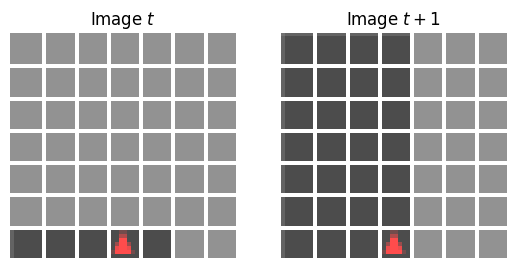

In [ ]:
# indx = 944#np.random.randint(0, len(img_sequence)-2)
# print(indx)

# img1 = img_sequence[indx]
# print(act_sequence[indx])
# img2 = img_sequence[indx + 1]

# plot_two_ing_side_by_side(img1, img2)

In [ ]:
361

## MarlGrid V3